## SetUp

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as f

from torch.utils.data import DataLoader, TensorDataset
# from torchvision import datasets
import matplotlib.pyplot as plt

In [3]:
import sys
if "/home/sdouka/Documents/Projects/InriaGitlab/experimental_grow/" not in sys.path:
    sys.path.append("/home/sdouka/Documents/Projects/InriaGitlab/experimental_grow/")
if '/home/tau/sdouka/codebase/experimental_grow' not in sys.path:
    sys.path.append('/home/tau/sdouka/codebase/experimental_grow')

from tools.datasets import get_dataset

In [4]:
device = "cuda"

In [5]:
# batch_size = 100
# total_in_features = 3
# total_out_features = 5
# in_shape = (12, 12)

# X = torch.rand(
#     (batch_size, total_in_features, *in_shape),
#     device=device
# )
# real_a = torch.rand((10, total_in_features, 3, 3), device=device)
# real_w = torch.rand((total_out_features, 10, 3, 3), device=device)
# real_b = torch.rand((10,), device=device)
# Y = f.conv2d(f.selu(f.conv2d(X, real_a, bias=real_b, padding="same")), real_w, padding="same")
# dataset = TensorDataset(X, Y)
# dataloader = DataLoader(dataset, batch_size=128)

In [6]:
train_set, dev_set, test_set = get_dataset(
    dataset_name="cifar10", dataset_path="../data", split_train_val=0.3
)
train_dataloader = DataLoader(train_set, batch_size=128)
dev_dataloader = DataLoader(dev_set, batch_size=128, shuffle=True)
test_dataloader = DataLoader(test_set, batch_size=128)
in_shape = (32, 32)
total_in_features = 3
total_out_features = 10

In [7]:
len(train_dataloader.dataset)

35000

In [8]:
neurons = 1000
kernel_size = (3, 3)
# alpha = torch.rand(
#     (neurons, total_in_features, *kernel_size),
#     device=device, requires_grad=True
# )
# omega = torch.rand(
#     (total_out_features, neurons, *kernel_size),
#     device=device, requires_grad=True
# )
# bias = torch.rand((neurons, 1), device=device, requires_grad=True)

In [9]:
# # print(X.shape, Y.shape)
# print(alpha.shape, omega.shape)
# print(bias.shape)

In [10]:
# h = f.conv2d(X, alpha, bias=bias.sum(dim=1).view(-1), padding="same")
# h = f.selu(h)
# o = f.conv2d(h, omega, padding="same")

In [11]:
# print(h.shape, o.shape)

In [12]:
class TwoLayerSparseCNN(nn.Module):
    def __init__(self, cin, csparse, cout, kernel_size=(3, 3), input_size=32*32, out_features=10):
        super().__init__()

        # self.alpha = nn.Parameter(torch.rand(
        #     (csparse, cin, *kernel_size),
        #     device=device,
        # ), requires_grad=True)
        # self.bias = nn.Parameter(torch.rand((csparse, 1), device=device), requires_grad=True)
        # self.omega = nn.Parameter(torch.rand(
        #     (cout, csparse, *kernel_size),
        #     device=device,
        # ), requires_grad=True)
        self.conv1 = nn.Conv2d(
            cin, csparse, kernel_size=kernel_size, padding="same", bias=True
        )
        self.conv2 = nn.Conv2d(
            csparse, cout, kernel_size=kernel_size, padding="same", bias=False
        )

        # # Channel gates (one scalar per channel)
        # self.gate = nn.Parameter(torch.ones(csparse))

        self.linear = nn.Linear(input_size*cout, out_features)

        # # SELU setup
        # nn.init.normal_(self.alpha, mean=0.0, std=(1.0 / cin) ** 0.5)
        # nn.init.normal_(self.omega, mean=0.0, std=(1.0 / csparse) ** 0.5)

    def forward(self, x):
        # x = f.selu(f.conv2d(x, self.alpha, bias=self.bias.sum(dim=1).view(-1), padding="same"))
        x = f.selu(self.conv1(x))
        # x = x * self.gate.view(1, -1, 1, 1)
        # x = f.selu(f.conv2d(x, self.omega, padding="same"))
        x = f.selu(self.conv2(x))
        x = torch.flatten(x, 1)
        x = self.linear(x)
        return x

In [13]:
def evaluate(model, dataloader, criterion):
    with torch.no_grad():
        model.eval()

        correct, total = 0, 0
        running_loss = 0

        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)

            y_hat = model(x)
            loss = criterion(y_hat, y)
            running_loss += loss.item()

            final_pred = y_hat.argmax(axis=1)
            count_this = final_pred == y
            count_this = count_this.sum()

            correct += count_this.item()
            total += len(y_hat)

        avg_loss = running_loss / len(dataloader)
    return avg_loss, (correct / total)

In [14]:
@torch.no_grad()
def prune_model(model, keep_channels):
    conv1 = model.conv1
    conv2 = model.conv2

    Cin = conv1.in_channels
    Cout = conv2.out_channels
    Cmid_new = len(keep_channels)

    pruned = TwoLayerSparseCNN(
        cin=Cin,
        csparse=Cmid_new,
        cout=Cout,
        kernel_size=conv1.kernel_size,
        input_size=32*32,
        out_features=10,
    ).to(device)

    # Copy conv1 weights
    pruned.conv1.weight.copy_(conv1.weight[keep_channels])
    if conv1.bias is not None:
        pruned.conv1.bias.copy_(conv1.bias[keep_channels])

    # Copy conv2 weights
    pruned.conv2.weight.copy_(conv2.weight[:, keep_channels])
    if conv2.bias is not None:
        pruned.conv2.bias.copy_(conv2.bias)

    return pruned

## Proximal Channel Lasso

In [12]:
@torch.no_grad()
def proximal_channel_lasso(model, lr, lambda_):
    """
    Applies coupled group LASSO shrinkage on intermediate channels.
    """
    W1 = model.conv1.weight  # (Cmid, Cin, k, k)
    W2 = model.conv2.weight  # (Cout, Cmid, k, k)

    Cmid = W1.shape[0]

    for j in range(Cmid):
        w1 = W1[j]        # (Cin, k, k)
        w2 = W2[:, j]     # (Cout, k, k)

        norm = torch.sqrt(
            torch.sum(w1 ** 2) + torch.sum(w2 ** 2)
        )

        if norm > 0:
            scale = max(0.0, 1.0 - lr * lambda_ / norm)
            if scale < .5:
                print()
            W1[j].mul_(scale)
            W2[:, j].mul_(scale)

@torch.no_grad()
def proximal_gate_l1(model, lr, lambda_):
    g = model.gate
    g.copy_(torch.sign(g) * torch.clamp(torch.abs(g) - lr * lambda_, min=0.0))

In [13]:
def train(
    model,
    dataloader,
    num_epochs=50,
    lr=1e-3,
    eta_proximal=1e-2,
    lambda_sparse=1e-4,
    weight_decay=1e-6,
    warmup_epochs=5,
    device="cuda",
):
    model.to(device)

    optimizer = torch.optim.Adam(
        model.parameters(), lr=lr, weight_decay=weight_decay
    )

    criterion = nn.CrossEntropyLoss()

    loss_history = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()

            y_hat = model(x)
            loss = criterion(y_hat, y)

            loss.backward()
            optimizer.step()

            # Proximal sparsity step (after warm-up)
            if epoch >= warmup_epochs:
                proximal_channel_lasso(
                    model,
                    lr=eta_proximal,
                    lambda_=lambda_sparse,
                )
                # proximal_gate_l1(
                #     model,
                #     lr=eta_proximal,
                #     lambda_=lambda_sparse,
                # )

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        loss_history.append(avg_loss)

        print(
            f"Epoch {epoch:03d} | "
            f"Loss: {avg_loss:.6f}"
        )
        
    return loss_history


In [11]:
model = TwoLayerSparseCNN(cin=3, csparse=100, cout=10, kernel_size=(3,3), input_size=32*32, out_features=10)

In [12]:
for param in list(model.parameters()):
    print(param.shape)

torch.Size([100, 3, 3, 3])
torch.Size([100])
torch.Size([10, 100, 3, 3])
torch.Size([10, 10240])
torch.Size([10])


In [13]:
losses = train(
    model,
    train_dataloader,
    num_epochs=100,
    lr=1e-3,
    eta_proximal=1e-2,
    lambda_sparse=5e-2,
    weight_decay=1e-6,
    warmup_epochs=10,
)
# train(
#     model,
#     train_dataloader,
#     num_epochs=100,
#     lr=1e-3,
#     lambda_sparse=5e-4,
#     weight_decay=1e-6,
#     warmup_epochs=10,
# )

Epoch 000 | Loss: 1.818982
Epoch 001 | Loss: 1.564695
Epoch 002 | Loss: 1.408677
Epoch 003 | Loss: 1.336874
Epoch 004 | Loss: 1.266519
Epoch 005 | Loss: 1.211774
Epoch 006 | Loss: 1.188864
Epoch 007 | Loss: 1.140748
Epoch 008 | Loss: 1.120654
Epoch 009 | Loss: 1.102181
Epoch 010 | Loss: 1.033288
Epoch 011 | Loss: 0.972715
Epoch 012 | Loss: 0.982962
Epoch 013 | Loss: 1.000684
Epoch 014 | Loss: 1.018684


































































































































































































































































































































































Epoch 015 | Loss: 1.062511
























































































































































































































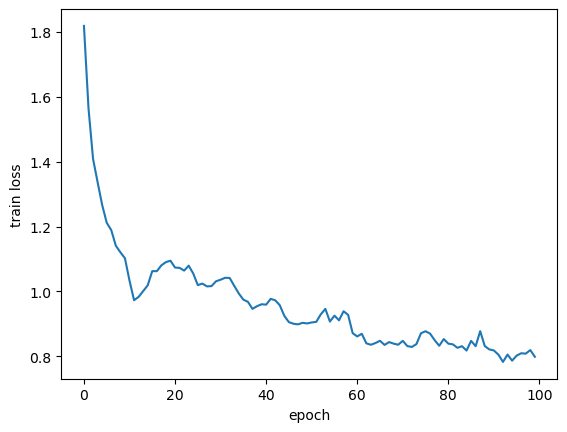

In [14]:
plt.figure()
plt.plot(losses)
plt.xlabel("epoch")
plt.ylabel("train loss")
plt.show()

In [ ]:
@torch.no_grad()
def channel_group_norms(model):
    W1 = model.conv1.weight
    W2 = model.conv2.weight

    norms = []
    for j in range(W1.shape[0]):
        n = torch.sqrt(
            torch.sum(W1[j]**2) + torch.sum(W2[:, j]**2)
        )
        norms.append(n)

    return torch.stack(norms)

@torch.no_grad()
def active_channels_from_norms(model, tol=1e-6):
    norms = channel_group_norms(model)
    keep = (norms > tol).nonzero(as_tuple=True)[0]
    return keep

In [16]:
keep = active_channels_from_norms(model, tol=1e-6)
print(len(keep), keep)

20 tensor([ 9, 10, 14, 20, 21, 22, 24, 26, 37, 45, 48, 49, 50, 52, 66, 86, 88, 95,
        97, 99], device='cuda:0')


In [17]:
model_pruned = prune_model(model, keep)

In [74]:
print(evaluate(model, train_dataloader, nn.CrossEntropyLoss()))

(0.9377474673852628, 0.66944)


In [75]:
print(evaluate(model_pruned, train_dataloader, nn.CrossEntropyLoss()))

(2.299780676559526, 0.11316)


## iiLasso

In [15]:
def iilasso_penalty(W, R, alpha):
    """||w_h|| + alpha/2 |w_h|^T R |w_h|

    Parameters
    ----------
    W : _type_
        (hidden_channels, in_channels, ...)
    R : _type_
        (in_channels, in_channels)
    alpha : _type_
        regularization
    """

    C_hid, C_in, _, _ = W.shape

    # u[h,c] = ||W[h,c,:,:]||
    u = W.abs().sum(dim=(2,3))  # (C_hid, C_in)

    l1_term = u.sum()
    # sum_h u_h^T R u_h
    quad_term = torch.einsum("hc,co,ho->h", u, R, u)
    quad_term = quad_term.sum()

    penalty = l1_term + alpha * quad_term

    # penalty = 0.0
    # for h in range(W.shape[0]):
    #     w_h = W[h]
    #     abs_w_h = w_h.abs()

    #     l1 = abs_w_h.sum()
    #     quad = 0.5 * alpha * abs_w_h @ R @ abs_w_h

    #     penalty += l1 + quad
    return penalty

def iilasso(out, Y, W1, R, alpha, lam):
    """1/2 ||out - Y||^2 - lambda * sparsity_penalty

    Parameters
    ----------
    out : _type_
        (n, out_channels, ...)
    Y : _type_
        (n, 1)
    W1 : _type_
        (hidden_channels, in_channels)
    R : _type_
        (hidden_channels, hidden_channels)
    alpha : _type_
        _description_
    lam : _type_
        _description_

    Returns
    -------
    _type_
        _description_
    """
    diff = (out.argmax(1) - Y).type(torch.float32)
    loss = 0.5 * (diff**2).mean()
    penalty = iilasso_penalty(W1, R, alpha)
    return loss + lam * penalty

@torch.no_grad()
def correlation_matrix(X):
    n, C, _, _ = X.shape
    Xc = X.permute(1, 0, 2, 3).reshape(C, -1)
    Xc -= Xc.mean(1, keepdim=True)
    # Xf = X.flatten(1)
    r = 1/n * Xc @ Xc.T
    r = r.abs()
    R = r/(1-r)
    mask = torch.diag(torch.zeros_like(R))
    R[range(len(R)), range(len(R))] = mask
    return R

def frob_norm_over_dims(mat, dims, eps=1e-12):
    if not isinstance(dims, tuple):
        dims = tuple(dims)
    norm = torch.sqrt((mat*mat).sum(dim=dims) + eps)
    return norm

@torch.no_grad()
def hidden_unit_importance(H, W2):
    """
    I_h = 1/sqrt(n*height*width) ||H[]:,h]||_2 ||W2[h]||_2
    H:  (n, h, ...)
    W2: (o, h, ...)
    returns: (h,) importance scores
    """
    n, _, height, width = H.shape
    H_norm = frob_norm_over_dims(H, dims=(0, 2, 3)) / ((n*height*width) ** 0.5)  # (h,)
    W2_norm = frob_norm_over_dims(W2, dims=(0, 2, 3))  # (h,)
    return H_norm * W2_norm

@torch.no_grad()
def prune_units_by_fraction(model, H, fraction):
    """
    fraction: e.g. 0.2 prunes lowest 20%
    """
    scores = hidden_unit_importance(H, model.conv2.weight)
    h = scores.numel()
    k = int(fraction * h) # importance fraction

    if k == 0:
        return torch.ones(h, dtype=torch.bool)

    threshold = torch.kthvalue(scores, k).values
    mask = scores > threshold

    model.conv1.weight[~mask, :, :, :] = 0.0
    model.conv2.weight[:, ~mask, :, :] = 0.0

    return mask

@torch.no_grad()
def loss_based_prune_mask(model, H, noise_floor):
    """
    H:      (n, C_hid, height, width)
    Ww:  (C_out, C_hid, kH, kW) or (C, m)
    """
    n, _, height, width = H.shape

    # contribution magnitude
    activation_contrib = frob_norm_over_dims(H, dims=(0,2,3))**2 * frob_norm_over_dims(model.conv2.weight, dims=(0,2,3))**2
    delta_loss = activation_contrib / (2 * n * height * width)

    mask = delta_loss >= noise_floor

    model.conv1.weight[~mask, :, :, :] = 0.0
    model.conv2.weight[:, ~mask, :, :] = 0.0

    return mask

@torch.no_grad()
def adaptive_scale_prune_mask(model, H, c=1e-3):
    scores = hidden_unit_importance(H, model.conv2.weight)
    threshold = c * scores.median()
    mask = scores >= threshold

    model.conv1.weight[~mask, :, :, :] = 0.0
    model.conv2.weight[:, ~mask, :, :] = 0.0

    return mask

In [16]:
# for x, y in train_dataloader:
#     R = correlation_matrix(x)
#     print(R.shape)
#     print(R)
#     break

In [25]:
def train_iilasso(
    model,
    dataloader,
    dev_dataloader,
    num_epochs=50,
    lr=1e-3,
    lambda_sparse=1e-4,
    alpha_sparse=0.1,
    weight_decay=1e-6,
    warmup_epochs=5,
    prune_threshold=1e-3,
    device="cuda",
):
    model.to(device)

    optimizer = torch.optim.Adam(
        model.parameters(), lr=lr, weight_decay=weight_decay
    )
    criterion = torch.nn.CrossEntropyLoss()

    loss_history = []
    cross_entropy_history, penalty_history = [], []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_cross_entropy, running_penalty = 0.0, 0.0

        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)
            R = correlation_matrix(x) # NOT the good place elenor!!!

            optimizer.zero_grad()

            y_hat = model(x)
            # loss = iilasso(
            #     out=y_hat,
            #     Y=y,
            #     W1=model.conv1.weight,
            #     R=R,
            #     alpha=alpha_sparse,
            #     lam=lambda_sparse
            # )
            cross_entropy = criterion(y_hat, y)
            penalty = iilasso_penalty(W=model.conv1.weight, R=R, alpha=alpha_sparse)
            loss = cross_entropy + lambda_sparse * penalty

            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            running_cross_entropy += cross_entropy.item()
            running_penalty += penalty.item()

        avg_loss = running_loss / len(dataloader)
        loss_history.append(avg_loss)

        avg_cross_entropy = running_cross_entropy / len(dataloader)
        cross_entropy_history.append(avg_cross_entropy)

        avg_penalty = running_penalty / len(dataloader)
        penalty_history.append(avg_penalty)

        # Proximal sparsity step (after warm-up)
        if epoch >= warmup_epochs:
            model.eval()
            with torch.no_grad():
                x_dev, _ = next(iter(dev_dataloader))
                x_dev = x_dev.to(device)
                H = f.selu(model.conv1(x_dev))
                mask = adaptive_scale_prune_mask(model=model, H=H, c=prune_threshold)
                print(f"Zeroed {H.shape[1] - torch.sum(mask)}/{H.shape[1]} channels")

        print(
            f"Epoch {epoch:03d} | "
            f"Loss: {avg_loss:.6f} | "
            f"Cross entropy: {avg_cross_entropy:.6f} | "
            f"Penalty: {avg_penalty:.6f} | "
        )
        
    return loss_history, cross_entropy_history, penalty_history


In [42]:
model = TwoLayerSparseCNN(cin=3, csparse=500, cout=10, kernel_size=(3,3), input_size=32*32, out_features=10)

In [43]:
loss_history, cross_entropy_history, penalty_history = train_iilasso(
    model,
    train_dataloader,
    dev_dataloader,
    num_epochs=15,
    lr=1e-3,
    lambda_sparse=5e-1,
    alpha_sparse=0.1,
    weight_decay=1e-6,
    warmup_epochs=5,
    prune_threshold=1e-1,
)

Epoch 000 | Loss: 135.926512 | Cross entropy: 2.038702 | Penalty: 267.775620 | 
Epoch 001 | Loss: 2.982984 | Cross entropy: 1.991067 | Penalty: 1.983834 | 
Epoch 002 | Loss: 2.844312 | Cross entropy: 1.891749 | Penalty: 1.905125 | 
Epoch 003 | Loss: 2.762691 | Cross entropy: 1.841753 | Penalty: 1.841876 | 
Epoch 004 | Loss: 2.712975 | Cross entropy: 1.809468 | Penalty: 1.807015 | 
Zeroed 39/500 channels
Epoch 005 | Loss: 2.687926 | Cross entropy: 1.788779 | Penalty: 1.798294 | 
Zeroed 45/500 channels
Epoch 006 | Loss: 2.654736 | Cross entropy: 1.761595 | Penalty: 1.786282 | 
Zeroed 44/500 channels
Epoch 007 | Loss: 2.616188 | Cross entropy: 1.714448 | Penalty: 1.803479 | 
Zeroed 44/500 channels
Epoch 008 | Loss: 2.573986 | Cross entropy: 1.678380 | Penalty: 1.791212 | 
Zeroed 32/500 channels
Epoch 009 | Loss: 2.555681 | Cross entropy: 1.656919 | Penalty: 1.797525 | 
Zeroed 24/500 channels
Epoch 010 | Loss: 2.543266 | Cross entropy: 1.636930 | Penalty: 1.812671 | 
Zeroed 18/500 channels

In [44]:
model.eval()
with torch.no_grad():
    x_dev, _ = next(iter(dev_dataloader))
    x_dev = x_dev.to(device)
    H = f.selu(model.conv1(x_dev))
    scores = hidden_unit_importance(H, model.conv2.weight)
    threshold = 0.1 * scores.median()
    mask = scores >= threshold
print(mask)
print(torch.sum(mask))

tensor([ True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True, False,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True, False,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True, False,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True, 

In [45]:
model.conv1.weight[~mask]

tensor([[[[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]]],


        [[[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]]],


        [[[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]]],


        [[[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]]],


        [[[0., 0., 0.],
          [0., 0., 0.],
          [0., 0., 0.]],

         [[0., 0., 0.],
      

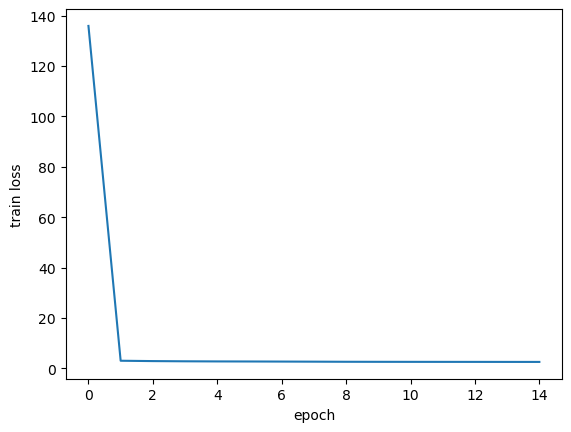

In [46]:
plt.figure()
plt.plot(loss_history)
plt.xlabel("epoch")
plt.ylabel("train loss")
plt.show()

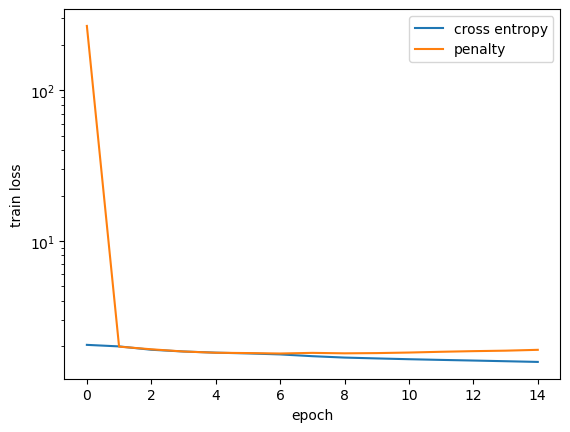

In [47]:
plt.figure()
plt.plot(cross_entropy_history, label="cross entropy")
plt.plot(penalty_history, label="penalty")
plt.xlabel("epoch")
plt.ylabel("train loss")
plt.yscale("log")
plt.legend()
plt.show()

In [48]:
print(evaluate(model, train_dataloader, nn.CrossEntropyLoss())) # 63

(1.5592917077732782, 0.45808571428571426)


In [49]:
print(evaluate(model, dev_dataloader, nn.CrossEntropyLoss()))  # 50

(1.6704393756591667, 0.418)


In [50]:
print(evaluate(model, test_dataloader, nn.CrossEntropyLoss()))  # 51

(1.64012235327612, 0.4226)


In [ ]:
pruned_model = 

## Classic

In [ ]:
def train_classic(
    model,
    dataloader,
    num_epochs=50,
    lr=1e-3,
    weight_decay=1e-6,
    device="cuda",
):
    model.to(device)

    optimizer = torch.optim.Adam(
        model.parameters(), lr=lr, weight_decay=weight_decay
    )
    criterion = torch.nn.CrossEntropyLoss()

    loss_history = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()

            y_hat = model(x)
            loss = criterion(y_hat, y)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        loss_history.append(avg_loss)

        print(
            f"Epoch {epoch:03d} | "
            f"Loss: {avg_loss:.6f}"
        )
        
    return loss_history

In [ ]:
model = TwoLayerSparseCNN(cin=3, csparse=100, cout=10, kernel_size=(3,3), input_size=32*32, out_features=10)

In [ ]:
loss_history = train_classic(
    model,
    train_dataloader,
    num_epochs=30,
    lr=1e-3,
    weight_decay=1e-6,
)

Epoch 000 | Loss: 1.790786
Epoch 001 | Loss: 1.546379
Epoch 002 | Loss: 1.423621
Epoch 003 | Loss: 1.350229
Epoch 004 | Loss: 1.266270
Epoch 005 | Loss: 1.229840
Epoch 006 | Loss: 1.178362
Epoch 007 | Loss: 1.150373
Epoch 008 | Loss: 1.135745
Epoch 009 | Loss: 1.091730
Epoch 010 | Loss: 1.080870
Epoch 011 | Loss: 1.038204
Epoch 012 | Loss: 0.994833
Epoch 013 | Loss: 0.971032
Epoch 014 | Loss: 0.998676
Epoch 015 | Loss: 0.998002
Epoch 016 | Loss: 0.964819
Epoch 017 | Loss: 0.945413
Epoch 018 | Loss: 0.935827
Epoch 019 | Loss: 0.947254
Epoch 020 | Loss: 0.927188
Epoch 021 | Loss: 0.909627
Epoch 022 | Loss: 0.882936
Epoch 023 | Loss: 0.878978
Epoch 024 | Loss: 0.852318
Epoch 025 | Loss: 0.832478
Epoch 026 | Loss: 0.848314
Epoch 027 | Loss: 0.831716
Epoch 028 | Loss: 0.812546
Epoch 029 | Loss: 0.804785


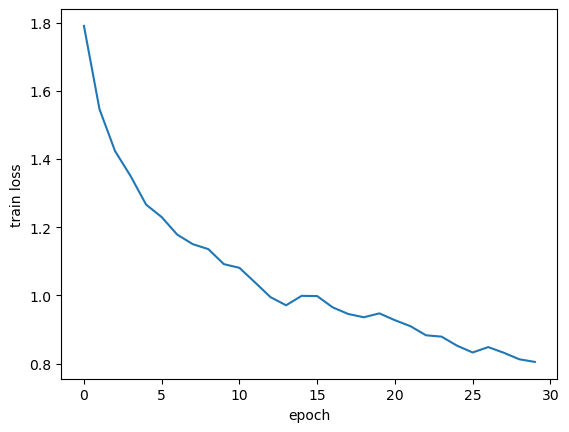

In [ ]:
plt.figure()
plt.plot(loss_history)
plt.xlabel("epoch")
plt.ylabel("train loss")
plt.show()

In [ ]:
print(evaluate(model, train_dataloader, nn.CrossEntropyLoss()))
print(evaluate(model, test_dataloader, nn.CrossEntropyLoss()))

(1.3040292531686977, 0.6136)
(2.7100002418590496, 0.4208)
